<a href="https://colab.research.google.com/github/ShaliniAnandaPhD/spot_whistle/blob/main/Spot_whistle1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install pipwin
!pipwin install pyaudio



/usr/local/lib/python3.10/dist-packages/pipwin/command.py:66: UserWarning: Found a non Windows system. Package installation might not work.
  warn("Found a non Windows system. Package installation might not work.")
Package `pyaudio` found in cache
https://download.lfd.uci.edu/pythonlibs/archived/PyAudio-0.2.11-cp310-cp310-win_amd64.whl
PyAudio-0.2.11-cp310-cp310-win_amd64.whl
File /root/pipwin/PyAudio-0.2.11-cp310-cp310-win_amd64.whl already exists
ERROR: PyAudio-0.2.11-cp310-cp310-win_amd64.whl is not a supported wheel on this platform.
Traceback (most recent call last):
  File "/usr/local/bin/pipwin", line 8, in <module>
    sys.exit(main())
  File "/usr/local/lib/python3.10/dist-packages/pipwin/command.py", line 103, in main
    cache.install(package)
  File "/usr/local/lib/python3.10/dist-packages/pipwin/pipwin.py", line 301, in install
    subprocess.check_call([executable, "-m", "pip", "install", wheel_file])
  File "/usr/lib/python3.10/subprocess.py", line 369, in check_call
   

In [2]:
!pip install pyaudio gtts pydub

  Using cached PyAudio-0.2.14.tar.gz (47 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached gTTS-2.5.1-py3-none-any.whl (29 kB)
  Using cached pydub-0.25.1-py2.py3-none-any.whl (32 kB)
  error: subprocess-exited-with-error
  
  × Building wheel for pyaudio (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for pyaudio
Failed to build pyaudio
ERROR: Could not build wheels for pyaudio, which is required to install pyproject.toml-based projects


In [3]:
!pip install pyaudio

  Using cached PyAudio-0.2.14.tar.gz (47 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  error: subprocess-exited-with-error
  
  × Building wheel for pyaudio (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for pyaudio
Failed to build pyaudio
ERROR: Could not build wheels for pyaudio, which is required to install pyproject.toml-based projects


In [9]:
!pip install simpleaudio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 10.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for simpleaudio: filename=simpleaudio-1.0.4-cp310-cp310-linux_x86_64.whl size=2054401 sha256=e3df54a8501149df9848cb40e46245622e97af34b61caf23fae125fa9bceaf87
  Stored in directory: /root/.cache/pip/wheels/10/70/ed/8c41675109565c2c65c3ac40d20859fc9d3f93a8efbb11d1c7
Successfully built simpleaudio


In [11]:
!pip install sounddevice

In [13]:
import numpy as np
import time
from gtts import gTTS
from pydub import AudioSegment
import os

# Audio Parameters
sample_rate = 44100  # Standard sampling rate
duration = 0.5  # Duration of each whistle in seconds
frequency = 800  # Base frequency of the whistle in Hz

def generate_whistle(duration, frequency):
    t = np.linspace(0, duration, int(duration * sample_rate), endpoint=False)
    wave = np.sin(2 * np.pi * frequency * t)
    noise = 0.1 * np.random.randn(len(wave))
    wave += noise
    wave *= 0.3  # Adjust amplitude for comfortable listening
    return wave

def play_whistle(whistle):
    AudioSegment(whistle.tobytes(), frame_rate=sample_rate, sample_width=2, channels=1).export("temp_whistle.wav", format="wav")
    os.system("aplay temp_whistle.wav")
    os.remove("temp_whistle.wav")

def text_to_rhythm(text):
    words = text.split()
    word_durations = []
    for word in words:
        try:
            word_tts = gTTS(word)
            word_tts.save("temp_word.mp3")
            word_audio = AudioSegment.from_mp3("temp_word.mp3")
            word_durations.append(len(word_audio))
            os.remove("temp_word.mp3")
        except:
            word_durations.append(0)
    return word_durations

# Example usage
text = "Hello world, how are you today?"
rhythm = text_to_rhythm(text)

for duration in rhythm:
    if duration > 0:
        whistle = generate_whistle(duration / 1000, frequency)  # Convert duration to seconds
        play_whistle(whistle)
    else:
        time.sleep(0.5)  # Pause for words with zero duration

In [15]:
!pip install pyttsx3

It seems like you are not currently in a push-up pose. To perform a proper push-up, follow these steps:
1. Start in a high plank position with your hands slightly wider than shoulder-width apart and your feet together.
2. Keep your body in a straight line from head to heels, engaging your core muscles.
3. Lower your body towards the ground by bending your elbows, keeping them close to your body.
4. Lower your chest until it nearly touches the ground, maintaining a straight body line.
5. Push your body back up to the starting position by extending your arms, keeping your body straight throughout the movement.
6. Repeat for the desired number of repetitions.


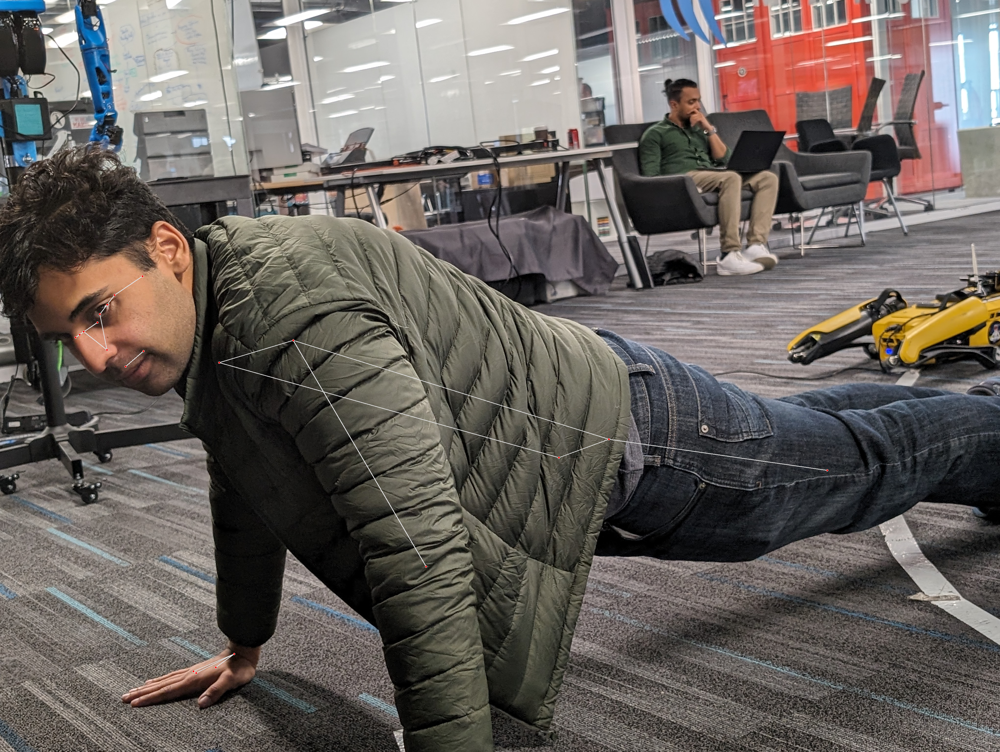

In [2]:
import cv2
import mediapipe as mp
import numpy as np
from google.colab.patches import cv2_imshow

# Initialize MediaPipe Pose
mp_pose = mp.solutions.pose
pose = mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.5)

def is_pushup(landmarks):
    left_shoulder = landmarks[mp_pose.PoseLandmark.LEFT_SHOULDER]
    right_shoulder = landmarks[mp_pose.PoseLandmark.RIGHT_SHOULDER]
    left_elbow = landmarks[mp_pose.PoseLandmark.LEFT_ELBOW]
    right_elbow = landmarks[mp_pose.PoseLandmark.RIGHT_ELBOW]
    left_wrist = landmarks[mp_pose.PoseLandmark.LEFT_WRIST]
    right_wrist = landmarks[mp_pose.PoseLandmark.RIGHT_WRIST]

    # Check if the person is in a plank position
    if left_shoulder.y > left_elbow.y and right_shoulder.y > right_elbow.y:
        # Check if the elbows are bent
        if left_elbow.y < left_shoulder.y and right_elbow.y < right_shoulder.y:
            # Check if the wrists are below the shoulders
            if left_wrist.y > left_shoulder.y and right_wrist.y > right_shoulder.y:
                return True

    return False

def analyze_pushup_pose(landmarks):
    left_shoulder = landmarks[mp_pose.PoseLandmark.LEFT_SHOULDER]
    right_shoulder = landmarks[mp_pose.PoseLandmark.RIGHT_SHOULDER]
    left_elbow = landmarks[mp_pose.PoseLandmark.LEFT_ELBOW]
    right_elbow = landmarks[mp_pose.PoseLandmark.RIGHT_ELBOW]
    left_wrist = landmarks[mp_pose.PoseLandmark.LEFT_WRIST]
    right_wrist = landmarks[mp_pose.PoseLandmark.RIGHT_WRIST]
    left_hip = landmarks[mp_pose.PoseLandmark.LEFT_HIP]
    right_hip = landmarks[mp_pose.PoseLandmark.RIGHT_HIP]

    feedback = "To improve your push-up pose, try the following:\n"

    # Check if the hands are wider than shoulder-width apart
    if left_wrist.x < left_shoulder.x - 0.1 or right_wrist.x > right_shoulder.x + 0.1:
        feedback += "- Place your hands slightly wider than shoulder-width apart for better stability.\n"

    # Check if the body is in a straight line
    if abs(left_shoulder.y - left_hip.y) > 0.1 or abs(right_shoulder.y - right_hip.y) > 0.1:
        feedback += "- Keep your body in a straight line from head to heels, engaging your core muscles.\n"

    # Check if the elbows are close to the body
    if left_elbow.x < left_shoulder.x - 0.1 or right_elbow.x > right_shoulder.x + 0.1:
        feedback += "- Keep your elbows close to your body as you lower down, tucking them in at about a 45-degree angle.\n"

    # Check if the chest is lowered close to the ground
    if left_shoulder.y > left_wrist.y + 0.2 or right_shoulder.y > right_wrist.y + 0.2:
        feedback += "- Lower your chest closer to the ground, aiming to bring it just a few inches off the surface.\n"

    # Check if the arms are fully extended at the top
    if left_elbow.y > left_shoulder.y - 0.1 or right_elbow.y > right_shoulder.y - 0.1:
        feedback += "- Fully extend your arms at the top of the push-up, pushing your body back up to the starting position.\n"

    return feedback

# Load the image
image_path = '/content/PXL_20240323_201822806.jpg'
image = cv2.imread(image_path)

# Check if the image was loaded successfully
if image is None:
    print("Failed to load the image. Please check the image path.")
else:
    # Convert the image to RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Process the image with MediaPipe Pose
    results = pose.process(image_rgb)

    # Initialize the feedback variable
    feedback = ""

    # Check if pose landmarks are detected
    if results.pose_landmarks:
        # Get the pose landmarks
        landmarks = results.pose_landmarks.landmark

        # Check if the person is doing a push-up
        if is_pushup(landmarks):
            # Analyze the push-up pose and provide feedback
            feedback = analyze_pushup_pose(landmarks)
        else:
            feedback = "It seems like you are not currently in a push-up pose. To perform a proper push-up, follow these steps:\n"
            feedback += "1. Start in a high plank position with your hands slightly wider than shoulder-width apart and your feet together.\n"
            feedback += "2. Keep your body in a straight line from head to heels, engaging your core muscles.\n"
            feedback += "3. Lower your body towards the ground by bending your elbows, keeping them close to your body.\n"
            feedback += "4. Lower your chest until it nearly touches the ground, maintaining a straight body line.\n"
            feedback += "5. Push your body back up to the starting position by extending your arms, keeping your body straight throughout the movement.\n"
            feedback += "6. Repeat for the desired number of repetitions."
    else:
        feedback = "No person detected in the image. Please make sure you are visible in the frame."

    # Display the feedback
    print(feedback)

    # Draw the landmarks and connections on the image
    mp_drawing = mp.solutions.drawing_utils
    if results.pose_landmarks:
        mp_drawing.draw_landmarks(image, results.pose_landmarks, mp_pose.POSE_CONNECTIONS)

    # Display the image
    cv2_imshow(image)

    # Close the window (optional in Colab)
    cv2.destroyAllWindows()
